In [1]:
import pandas as pd
import numpy as np
import skimage.io as io

In [2]:
df = pd.read_csv(r"/content/drive/My Drive/深度專題/Tom_adj.csv")
df = df.iloc[:7000, 1:11]
df = np.array(df)
df.shape

(7000, 10)

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import torch
import torch.utils.data as Data
import numpy as np  #dataframe不能直接轉成tensor,要先轉成numpy

In [5]:
import matplotlib.pyplot as plt

In [6]:
torch.cuda.is_available()

True

In [7]:
import matplotlib.image as mpimg

In [8]:
import os
imagelist = os.listdir(r"/content/drive/My Drive/深度專題/Tom_img")
imagelist.sort(key= lambda x:x[12:-6])
imagelist = np.array(imagelist)
print(imagelist[0])

Tom_Holland_000001_0.png


In [9]:
t = []
for i in imagelist:
  img = io.imread(r"/content/drive/My Drive/深度專題/Tom_img/"+i)
  t.append(img)
  print(i)
  #plt.imshow(img)
  #plt.show()

T = np.array(t)

串流輸出內容已截斷至最後 5000 行。
Tom_Holland_002321_0.png
Tom_Holland_002322_0.png
Tom_Holland_002323_0.png
Tom_Holland_002324_0.png
Tom_Holland_002325_0.png
Tom_Holland_002326_0.png
Tom_Holland_002327_0.png
Tom_Holland_002328_0.png
Tom_Holland_002329_0.png
Tom_Holland_002330_0.png
Tom_Holland_002331_0.png
Tom_Holland_002332_0.png
Tom_Holland_002335_0.png
Tom_Holland_002336_0.png
Tom_Holland_002337_0.png
Tom_Holland_002338_0.png
Tom_Holland_002339_0.png
Tom_Holland_002340_0.png
Tom_Holland_002341_0.png
Tom_Holland_002342_0.png
Tom_Holland_002343_0.png
Tom_Holland_002344_0.png
Tom_Holland_002345_0.png
Tom_Holland_002346_0.png
Tom_Holland_002347_0.png
Tom_Holland_002349_0.png
Tom_Holland_002350_0.png
Tom_Holland_002351_0.png
Tom_Holland_002352_0.png
Tom_Holland_002353_0.png
Tom_Holland_002354_0.png
Tom_Holland_002355_0.png
Tom_Holland_002356_0.png
Tom_Holland_002358_0.png
Tom_Holland_002359_0.png
Tom_Holland_002360_0.png
Tom_Holland_002361_0.png
Tom_Holland_002362_0.png
Tom_Holland_002363_0.png
Tom_

In [10]:
import cv2

In [11]:
T_gray = []
for i in range(7000):
  T_gray_single = cv2.cvtColor(T[i], cv2.COLOR_BGR2GRAY)
  T_gray.append(T_gray_single)
T_gray = np.array(T_gray)
print(T_gray.shape)

(7000, 256, 256)


In [12]:
nr, nc = T_gray[0].shape[:2]
nr, nc = nr//8, nc//8
print(nr, nc)
T_rescale = []
for i in range(len(T_gray)):
  img = cv2.resize(T_gray[i], (nr, nc), interpolation = cv2.INTER_LINEAR)
  T_rescale.append(img)
T_rescale = np.array(T_rescale)
print(T_rescale.shape)

32 32
(7000, 32, 32)


In [13]:
T_rescale = np.expand_dims(T_rescale, axis=1)
T_rescale.shape

(7000, 1, 32, 32)

In [14]:
class MyDataset(Data.Dataset): #繼承Data.Dataset
  def __init__(self, f, l, train=True, transform=None): #讀資料可以不用transform,但還是要傳資料進來
    if train == True:
      f = f[:5600]
      l = l[:5600]
    else:
      f = f[5600:]
      l = l[5600:]
    
    self.features = f
    self.labels = l
    self.transform = transform

  def __len__(self): #所有的dataset都要實作__len__
    return len(self.labels)
  
  def __getitem__(self, idx): #把資料集的資料一筆一筆取出來 #參數idx可以給定範圍
    if torch.is_tensor(idx):
      idx = idx.tolist() #轉成list
    
    X = self.features[idx]
    Y = self.labels[idx]
    
    if self.transform:
      X = self.transform(X)
      Y = self.transform(Y)
    
    return X, Y

In [15]:
def toTensor(x):
  return torch.tensor(x)

In [16]:
# T_rescale = T_rescale.reshape(-1, 3, 32, 32)
# print(T_rescale.shape)

In [17]:
train_dataset = MyDataset(T_rescale, df, train=True, transform=toTensor)
test_dataset = MyDataset(T_rescale, df, train=False, transform=toTensor)

In [18]:
train_dataset[0]

(tensor([[[ 64,  50,  46,  ..., 177, 176, 145],
          [ 53,  48,  49,  ..., 178, 178, 134],
          [ 45,  43,  52,  ..., 178, 178, 119],
          ...,
          [ 62,  62,  59,  ...,  23,  21,  21],
          [ 65,  61,  43,  ...,  30,  21,  21],
          [ 54,  41,  37,  ...,  39,  31,  21]]], dtype=torch.uint8),
 tensor([ 85,  85, 174,  85, 133, 136,  90, 172, 162, 174]))

In [19]:
input_size = 32*32
hidden_size = 100
num_classes = 10
num_epoch = 50
batch_size = 10
learning_rate = 0.0001

In [20]:
train_loader = Data.DataLoader(dataset=train_dataset,
                batch_size=batch_size,
                shuffle=True)
test_loader = Data.DataLoader(dataset=test_dataset,
                batch_size=batch_size,
                shuffle=False)

In [21]:
test_dataset.features.shape, test_dataset.labels.shape

((1400, 1, 32, 32), (1400, 10))

In [22]:
print(T_rescale.shape)
print(df.shape)

(7000, 1, 32, 32)
(7000, 10)


In [23]:
import torch.nn as nn

In [24]:
class Model_cnn(nn.Module):
  def __init__(self):
    super(Model_cnn, self).__init__()
    self.conv = nn.Sequential(
        nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1),
        nn.ReLU(), #acctivation function
        nn.Conv2d(64, 128, kernel_size=3,stride=1, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(stride=2, kernel_size=2),
        nn.MaxPool2d(stride=2, kernel_size=2)
    )
    self.dense = nn.Sequential(
        nn.Linear(8*8*128, 512),
        nn.ReLU(),
        nn.Linear(512, 10)
    )
  
  def forward(self, x):
    out = self.conv(x)
    out = out.view(-1, 8*8*128)
    out = self.dense(out)
    return out

In [25]:
model_cnn = Model_cnn()
model_cnn.cuda()

Model_cnn(
  (conv): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (dense): Sequential(
    (0): Linear(in_features=8192, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=10, bias=True)
  )
)

In [26]:
import torch.optim as opt

In [27]:
loss_fn = nn.MSELoss() #要做分類所以用CrossEntropyLoss
optimizer = opt.Adam(model_cnn.parameters(), lr=learning_rate) #Lacoon實驗效果最好

In [28]:
from torch.autograd import Variable

In [29]:
for epoch in range(num_epoch):
  for i, (features, labels) in enumerate(train_loader): #python內的功能,幫裡面的東西加上他的編號,用變數i去接他
    features = Variable(features.type(torch.cuda.FloatTensor)) #將原本28*28的tensor轉成一維的向量,把整張圖片拉直變成一個向量 #view可以做reshape的動作 #-1保留原本的維度
    labels = Variable(labels.type(torch.cuda.FloatTensor))
    optimizer.zero_grad()
    outputs = model_cnn(features)
    loss = loss_fn(outputs, labels.float())
    loss.backward()
    optimizer.step()
    if (i+1)%100 == 0:
      print("Epoch:%d, Batch:%d, Loss:%.4f" %(epoch+1, i+1, loss.data))

Epoch:1, Batch:100, Loss:588.3989
Epoch:1, Batch:200, Loss:187.2345
Epoch:1, Batch:300, Loss:220.3190
Epoch:1, Batch:400, Loss:447.4050
Epoch:1, Batch:500, Loss:487.7217
Epoch:2, Batch:100, Loss:320.1557
Epoch:2, Batch:200, Loss:359.6945
Epoch:2, Batch:300, Loss:132.7020
Epoch:2, Batch:400, Loss:190.4302
Epoch:2, Batch:500, Loss:330.4923
Epoch:3, Batch:100, Loss:262.1074
Epoch:3, Batch:200, Loss:114.4896
Epoch:3, Batch:300, Loss:96.8314
Epoch:3, Batch:400, Loss:45.5547
Epoch:3, Batch:500, Loss:251.5031
Epoch:4, Batch:100, Loss:72.1518
Epoch:4, Batch:200, Loss:157.6099
Epoch:4, Batch:300, Loss:76.2179
Epoch:4, Batch:400, Loss:116.2799
Epoch:4, Batch:500, Loss:40.1024
Epoch:5, Batch:100, Loss:38.2381
Epoch:5, Batch:200, Loss:147.8013
Epoch:5, Batch:300, Loss:109.5727
Epoch:5, Batch:400, Loss:69.3906
Epoch:5, Batch:500, Loss:74.1402
Epoch:6, Batch:100, Loss:29.9244
Epoch:6, Batch:200, Loss:77.7066
Epoch:6, Batch:300, Loss:88.8836
Epoch:6, Batch:400, Loss:19.7822
Epoch:6, Batch:500, Loss:2

In [30]:
import torch

In [32]:
correct = 0
correct_LE = 0
correct_RE = 0
correct_N = 0
correct_LM = 0
correct_RM = 0
total = 0
t = []
t_label = []
batch_of_first = []
batch_of_first_label = []
for features, labels in test_loader:
  # print(features.shape)
  # print(labels.shape)
  # features = Variable(features.type(torch.cuda.FloatTensor))
  outputs = model_cnn(Variable(features.type(torch.cuda.FloatTensor)))
  outputs = outputs.cpu()

  temp = outputs.detach().numpy()
  batch_of_first.append(temp[0])

  temp_label = labels.detach().numpy()
  batch_of_first_label.append(temp_label[0])

  for i in range(0, 10):
    for j in range(0, 10, 2):
      correct += (torch.sqrt(((outputs[i][j] - labels[i][j])**2+(outputs[i][j+1] - labels[i][j+1])**2))<10).sum()
      # print(correct)
    correct_LE += (torch.sqrt(((outputs[i][0] - labels[i][0])**2+(outputs[i][1] - labels[i][1])**2))<10).sum()
    correct_RE += (torch.sqrt(((outputs[i][2] - labels[i][2])**2+(outputs[i][3] - labels[i][3])**2))<10).sum()
    correct_N += (torch.sqrt(((outputs[i][4] - labels[i][4])**2+(outputs[i][5] - labels[i][5])**2))<10).sum()
    correct_LM += (torch.sqrt(((outputs[i][6] - labels[i][6])**2+(outputs[i][7] - labels[i][7])**2))<10).sum()
    correct_RM += (torch.sqrt(((outputs[i][8] - labels[i][8])**2+(outputs[i][9] - labels[i][9])**2))<10).sum()

  total += labels.size(0)

print("Accuracy:%.3f%%" %(100.0* float(correct)/float(total*5)))
print("Left Eye Accuracy:%.3f%%" %(100.0* float(correct_LE)/float(total)))
print("Right Eye Accuracy:%.3f%%" %(100.0* float(correct_RE)/float(total)))
print("Nose Accuracy:%.3f%%" %(100.0* float(correct_N)/float(total)))
print("Left Mouth Accuracy:%.3f%%" %(100.0* float(correct_LM)/float(total)))
print("Right Mouth Accuracy:%.3f%%" %(100.0* float(correct_RM)/float(total)))

Accuracy:74.986%
Left Eye Accuracy:79.071%
Right Eye Accuracy:80.357%
Nose Accuracy:74.643%
Left Mouth Accuracy:72.571%
Right Mouth Accuracy:68.286%


In [33]:
batch_of_first = np.array(batch_of_first)
print(batch_of_first.shape)

batch_of_first_label = np.array(batch_of_first_label)
print(batch_of_first_label.shape)

for i in range(len(batch_of_first)):
  t_out = batch_of_first[i].reshape(-1, 2)
  t.append(t_out)
t = np.array(t)
print(t.shape)

for i in range(len(batch_of_first_label)):
  t_out_label = batch_of_first_label[i].reshape(-1, 2)
  t_label.append(t_out_label)
t_label = np.array(t_label)
print(t_label.shape)

(140, 10)
(140, 10)
(140, 5, 2)
(140, 5, 2)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Support for uppercase single-letter colors is deprecated since Matplotlib 3.1 and will be removed in 3.3; please use lowercase instead.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: Support for uppercase single-letter colors is deprecated since Matplotlib 3.1 and will be removed in 3.3; please use lowercase instead.
  del sys.path[0]


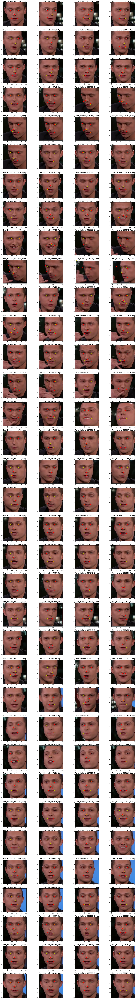

In [34]:
img_name = []
for i in range(5600, 7000, 10):
  img_name_temp = imagelist[i]
  img_name.append(img_name_temp)
# img_name = np.array(img_name)
# print(img_name)

f, a = plt.subplots(35, 4, figsize=(30, 220))
for i in range(140):
  image = io.imread(os.path.join(r"/content/drive/My Drive/深度專題/Tom_img/{}".format(img_name[i])))
  a[(i//4)][(i%4)].imshow(image)
  a[(i//4)][(i%4)].scatter(t[i][:, 0], t[i][:, 1], s=80, marker='o', c='R')
  a[(i//4)][(i%4)].scatter(t_label[i][:, 0], t_label[i][:, 1], s=80, marker='x', c='Y')
  a[(i//4)][(i%4)].set_title(img_name[i], fontsize=20)
plt.draw()
plt.show()

In [35]:
# correct = 0
# total = 0
# t = []
# batch_of_first = []
# for features, labels in test_loader:
#   # print(features.shape)
#   # print(labels.shape)
#   features = Variable(features.type(torch.cuda.FloatTensor))
#   outputs = model_cnn(features.type(torch.cuda.FloatTensor))
#   outputs = outputs.cpu()

#   temp = outputs.detach().numpy()
#   batch_of_first.append(temp[0])

#   correct += (abs(outputs - labels) < 5).sum()
#   total += labels.size(0)
# print("Accuracy:%.3f%%" %(100.0* float(correct)/float(total*10)))

# batch_of_first = np.array(batch_of_first)
# print(batch_of_first.shape)

# for i in range(len(batch_of_first)):
#   t_out = batch_of_first[i].reshape(-1, 2)
#   t.append(t_out)
# t = np.array(t)
# print(t.shape)